# Hinzunahme des Landes

In [1]:
from utils import constants

import os
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
pd.set_option('display.max_colwidth', None)

import folium
import pycountry
import math

### Importieren der Daten

In [2]:
dtype={'Population': 'Int64'}

path = './answers/'
file_name_template = '{model_key}-Instruct-{template_name}{add_country}{proccess_flag}'
dfs = {}

# für alle Modelle bzw. Größen von Llama 3.1 (8B, 70B, 405B)
for model_key, model_name in constants.models.items():
    model_number = '-'.join(model_key.split('-')[1:])

    for add_country in [True, False]:
        prefix = model_number + ('-country' if add_country else '')

        file_name_json = file_name_template.format(model_key=model_key, template_name='json', add_country= '-country' if add_country else '', proccess_flag='-p')
        dfs[str(prefix + '-json')] = pd.read_csv(os.path.join(path, file_name_json + '.csv'), dtype=dtype)

        file_name_llm = file_name_template.format(model_key=model_key, template_name='original', add_country= '-country' if add_country else '', proccess_flag='-p_llm')
        dfs[str(prefix + '-llm')] = pd.read_csv(os.path.join(path, file_name_llm + '.csv'), dtype=dtype)

        file_name_regex = file_name_template.format(model_key=model_key, template_name='original', add_country= '-country' if add_country else '', proccess_flag='-p_regex')
        dfs[str(prefix + '-regex')] = pd.read_csv(os.path.join(path, file_name_regex + '.csv'), dtype=dtype)

### Anteil der fehlerhaften Antworten und durchschnittlicher Fehler

In [3]:
dfs_keys = dfs.keys()

table = pd.DataFrame({
    'Name': pd.Series(dtype='object'),
    'Anzahl der Anfragen': pd.Series(dtype='int64'),
    'Anzahl der Fehler': pd.Series(dtype='int64'),
    'Prozentualeranteil der Fehler': pd.Series(dtype='float64'),
    'Durchschnittlicher Fehler': pd.Series(dtype='float64'),
    'Standardabweichung': pd.Series(dtype='float64'),
})

table['Name'] = dfs_keys

ns = np.array([dfs[key].shape[0] for key in dfs_keys])
table['Anzahl der Anfragen'] = ns

nans = np.array([dfs[key]['Error'].isna().sum() for key in dfs_keys])
table['Anzahl der Fehler'] = nans

percentages = nans / ns * 100
table['Prozentualeranteil der Fehler'] = percentages

table['Durchschnittlicher Fehler'] = [np.nanmean(dfs[key]['Error']) for key in dfs_keys]

table['Standardabweichung'] = [np.nanstd(dfs[key]['Error']) for key in dfs_keys]

print("\"json\": Eine Anfrage, die das json-Format vorschreibt\n\"llm\": Die originale Anfrage, allerdings werden die Koordinaten aus der Antwort mithilfe eines LLM's extrahiert\n\"regex\": Die originale Anfrage mit der originalen Auswertung")

with pd.option_context('display.precision', 2):
    display(table[['Name', 'Anzahl der Anfragen', 'Prozentualeranteil der Fehler', 'Durchschnittlicher Fehler', 'Standardabweichung']])

"json": Eine Anfrage, die das json-Format vorschreibt
"llm": Die originale Anfrage, allerdings werden die Koordinaten aus der Antwort mithilfe eines LLM's extrahiert
"regex": Die originale Anfrage mit der originalen Auswertung


,Name,Anzahl der Anfragen,Prozentualeranteil der Fehler,Durchschnittlicher Fehler,Standardabweichung
0,3.1-8B-country-json,3527,0.23,166.83,584.74
1,3.1-8B-country-llm,3527,3.60,141.82,876.89
2,3.1-8B-country-regex,3527,85.97,1452.08,4075.53
3,3.1-8B-json,3527,0.40,755.67,2355.14
4,3.1-8B-llm,3527,11.88,369.93,1699.75
5,3.1-8B-regex,3527,87.64,1789.77,4409.02
6,3.1-70B-country-json,3527,0.00,112.75,815.55
7,3.1-70B-country-llm,3527,2.86,83.44,754.53
8,3.1-70B-country-regex,3527,93.20,1478.05,4155.88
9,3.1-70B-json,3527,0.20,628.56,2356.44


### Visualisierung

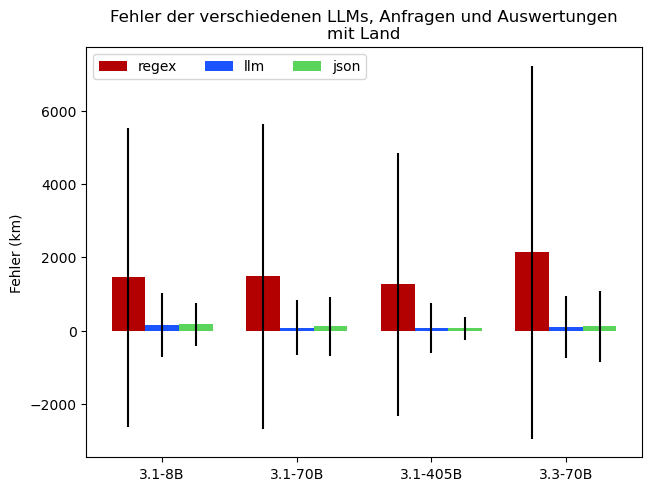

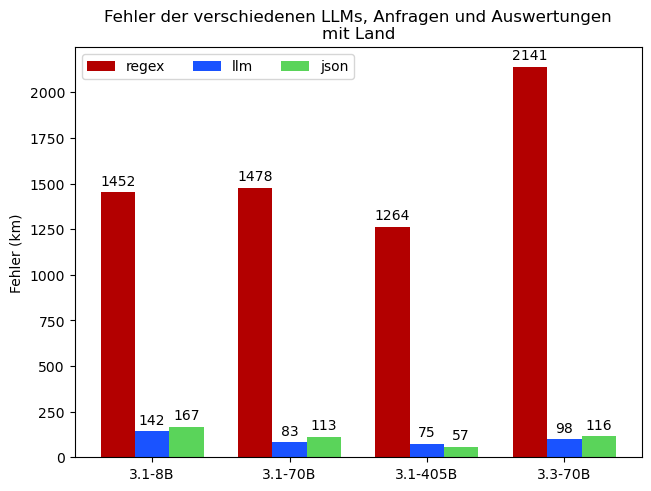

In [4]:
def get_mean_error(keys):
    return [np.nanmean(dfs[key]['Error']) for key in keys]

def get_std(keys):
    stds = [np.nanstd(dfs[key]['Error']) for key in keys]
    return stds


sizes = ('3.1-8B', '3.1-70B', '3.1-405B', '3.3-70B')

keys_regex = [key for key in dfs.keys() if key.endswith('country-regex')]
keys_llm = [key for key in dfs.keys() if key.endswith('country-llm')]
keys_json = [key for key in dfs.keys() if key.endswith('country-json')]

model_error = {
    'regex': (get_mean_error(keys_regex), get_std(keys_regex), '#b30000'),
    'llm': (get_mean_error(keys_llm), get_std(keys_llm), '#1a53ff'),
    'json': (get_mean_error(keys_json), get_std(keys_json), '#5ad45a'),
}

x = np.arange(len(sizes))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, (measurement, stds, color) in model_error.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, color=color, yerr=stds)
    # ax.bar_label(rects, padding=3, fmt="{:.1f}")
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Fehler (km)')
ax.set_title('Fehler der verschiedenen LLMs, Anfragen und Auswertungen\nmit Land')
ax.set_xticks(x + width, sizes)
ax.legend(loc='upper left', ncols=3)
# ax.set_ylim(0, 250)

plt.savefig('./results/country_error.pdf')

multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, (measurement, stds, color) in model_error.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, color=color, yerr=0)
    ax.bar_label(rects, padding=3, fmt="{:.0f}")
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Fehler (km)')
ax.set_title('Fehler der verschiedenen LLMs, Anfragen und Auswertungen\nmit Land')
ax.set_xticks(x + width, sizes)
ax.legend(loc='upper left', ncols=3)
# ax.set_ylim(0, 250)

plt.savefig('./results/country_error_no_std.pdf')

plt.show()

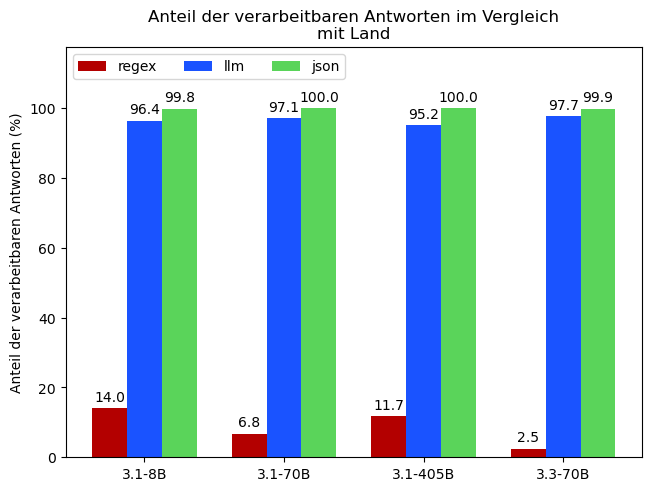

regex: 8.76 4.46
llm: 96.6 0.95
json: 99.91 0.09


In [5]:
def get_p(keys):
    # Der prozentuale Anteil der Antworten, die korrekt ausgewertet werden konnten
    ns = np.array([dfs[key].shape[0] for key in keys])
    nans = np.array([dfs[key]['Error'].isna().sum() for key in keys])
    percentages = (ns - nans) / ns * 100
    return percentages


sizes = ('3.1-8B', '3.1-70B', '3.1-405B', '3.3-70B')

keys_regex = [key for key in dfs.keys() if key.endswith('country-regex')]
keys_llm = [key for key in dfs.keys() if key.endswith('country-llm')]
keys_json = [key for key in dfs.keys() if key.endswith('country-json')]

error_regex = get_p(keys_regex)
error_llm = get_p(keys_llm)
error_json = get_p(keys_json)

model_error = {
    'regex': (get_p(keys_regex), '#b30000'),
    'llm': (get_p(keys_llm), '#1a53ff'),
    'json': (get_p(keys_json), '#5ad45a'),
}

x = np.arange(len(sizes))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, (measurement, color) in model_error.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, color=color)
    ax.bar_label(rects, padding=3, fmt="{:.1f}")
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Anteil der verarbeitbaren Antworten (%)')
ax.set_title('Anteil der verarbeitbaren Antworten im Vergleich\nmit Land')
ax.set_xticks(x + width, sizes)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 117.5)

plt.savefig('./results/country_p.pdf')
plt.show()

print("regex:", round(np.mean(error_regex), 2), round(np.std(error_regex), 2))
print("llm:", round(np.mean(error_llm), 2), round(np.std(error_llm), 2))
print("json:", round(np.mean(error_json), 2), round(np.std(error_json), 2))

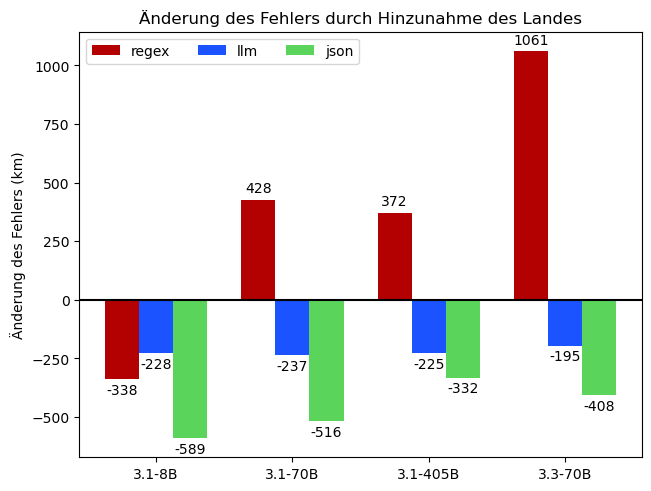

regex: \( \SI{-40.48}{\percent} \pm \num{41.45} \) Prozentpunkte
llm: \( \SI{69.27}{\percent} \pm \num{5.49} \) Prozentpunkte
json: \( \SI{80.83}{\percent} \pm \num{3.15} \) Prozentpunkte


In [6]:
def get_error_diff(keys_country, keys):
    error_country = np.array(get_mean_error(keys_country))
    error = np.array(get_mean_error(keys))
    return error_country - error


def get_mean_std(keys_country, keys):
    error_country = np.array(get_mean_error(keys_country))
    error = np.array(get_mean_error(keys))
    diff_percent = ((error - error_country) / error) * 100
    diff_percent_mean = np.mean(diff_percent)
    diff_percent_std = np.std(diff_percent)
    return f"\\( \\SI{{{round(diff_percent_mean, 2)}}}{{\\percent}} \\pm \\num{{{round(diff_percent_std, 2)}}} \\) Prozentpunkte"

sizes = ('3.1-8B', '3.1-70B', '3.1-405B', '3.3-70B')

keys_country_regex = [key for key in dfs.keys() if key.endswith('country-regex')]
keys_country_llm = [key for key in dfs.keys() if key.endswith('country-llm')]
keys_country_json = [key for key in dfs.keys() if key.endswith('country-json')]

keys_regex = [key for key in dfs.keys() if not key.endswith('country-regex') and key.endswith('regex')]
keys_llm = [key for key in dfs.keys() if not key.endswith('country-llm') and key.endswith('llm')]
keys_json = [key for key in dfs.keys() if not key.endswith('country-json') and key.endswith('json')]

model_error = {
    'regex': (get_error_diff(keys_country_regex, keys_regex), '#b30000'),
    'llm': (get_error_diff(keys_country_llm, keys_llm), '#1a53ff'),
    'json': (get_error_diff(keys_country_json, keys_json), '#5ad45a'),
}

x = np.arange(len(sizes))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, (measurement, color) in model_error.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute, color=color)
    ax.bar_label(rects, padding=3, fmt="{:.0f}")
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Änderung des Fehlers (km)')
ax.set_title('Änderung des Fehlers durch Hinzunahme des Landes')
ax.set_xticks(x + width, sizes)
ax.legend(loc='upper left', ncols=3)
# ax.set_ylim(0, 117.5)
ax.axhline(y=0, color='k')
plt.savefig('./results/country_vs_no_country.pdf')
plt.show()

print('regex:', get_mean_std(keys_country_regex, keys_regex))
print('llm:', get_mean_std(keys_country_llm, keys_llm))
print('json:', get_mean_std(keys_country_json, keys_json))

# Karte

In [7]:
df = dfs['3.1-8B-country-json'].sort_values('Error')

# Gruppengröße bestimmen und Farben festlegen
colors = ['darkgreen', 'green', 'lightgreen', 'orange', 'lightred', 'red', 'darkred']
number_per_color = int(df.shape[0] / len(colors)) + 1
group_index = 0

# Karte und Gruppen erstellen
m = folium.Map(location=[51.9579, 7.6151])

group_0 = folium.FeatureGroup("perfekt").add_to(m)
group_1 = folium.FeatureGroup("sehr gut").add_to(m)
group_2 = folium.FeatureGroup("gut").add_to(m)
group_3 = folium.FeatureGroup("okay").add_to(m)
group_4 = folium.FeatureGroup("etwas schlechter").add_to(m)
group_5 = folium.FeatureGroup("schlecht").add_to(m)
group_6 = folium.FeatureGroup("sehr schlecht").add_to(m)

groups = [group_0, group_1, group_2, group_3, group_4, group_5, group_6]

# Jeden Datenpunkt einzeichnen
for counter, (index, row) in enumerate(df.iterrows()):

    # Muss die nächste Gruppe angefangen werden?
    if counter % number_per_color == 0 and counter > 0:
        group_index += 1

    # Daten extrahieren
    coords = [row['Latitude'], row['Longitude']]
    coords_llm = [row['LatitudeLLM'], row['LongitudeLLM']]
    error = f"{row['Error']:.2f} km"

    # Beschriftung
    country_code = row['Country']
    country = dict(pycountry.countries.lookup(country_code))['name']

    location_name = f"{row['City']}, {country}"
    location_name_llm = 'LLM - ' + location_name

    # Nur Datenpunkte hinzufügen, die keine 'leeren' Werte haben
    if math.isnan(coords[0]) or math.isnan(coords[1]) or math.isnan(coords_llm[0]) or math.isnan(coords_llm[1]):
        continue

    group_color = colors[group_index]
    group = groups[group_index]

    # Echte Position
    folium.Marker(
        location=coords,
        tooltip=location_name,
        icon=folium.Icon(color=group_color)
    ).add_to(group)

    # LLM Position
    folium.Marker(
        location=coords_llm,
        tooltip=location_name_llm,
        icon=folium.Icon(color=group_color, icon='glyphicon-flag')
    ).add_to(group)

    # Strecke zwischen den Positionen
    trail_coordinates = [
        coords, coords_llm
    ]

    folium.PolyLine(
        trail_coordinates,
        tooltip=error,
        color='#FFCCCB' if group_color == 'lightred' else group_color # Warum kann man keine Linien in 'lightred' zeichnen... aber Punkte...
    ).add_to(group)
    
folium.LayerControl().add_to(m) # Möglichkeit die verschiedenen Gruppen auszublenden
# m.save("Test.html")
m

In [8]:
df = dfs['3.1-8B-country-json'].sort_values('Error')
df = df[df['City'] == 'pasadena']

# Karte und Gruppen erstellen
m = folium.Map(location=[51.9579, 7.6151])

# Jeden Datenpunkt einzeichnen
for (index, row) in df.iterrows():
    # Daten extrahieren
    coords = [row['Latitude'], row['Longitude']]
    coords_llm = [row['LatitudeLLM'], row['LongitudeLLM']]
    error = f"{row['Error']:.2f} km"

    # Beschriftung
    country_code = row['Country']
    country = dict(pycountry.countries.lookup(country_code))['name']

    location_name = f"{row['City']}, {country}"
    location_name_llm = 'LLM - ' + location_name

    # Nur Datenpunkte hinzufügen, die keine 'leeren' Werte haben
    if math.isnan(coords[0]) or math.isnan(coords[1]) or math.isnan(coords_llm[0]) or math.isnan(coords_llm[1]):
        continue

    # Echte Position
    folium.Marker(
        location=coords,
        tooltip=location_name,
        icon=folium.Icon(color='purple')
    ).add_to(m)

    # LLM Position
    folium.Marker(
        location=coords_llm,
        tooltip=location_name_llm,
        icon=folium.Icon(icon='glyphicon-flag', color='purple')
    ).add_to(m)

    # Strecke zwischen den Positionen
    trail_coordinates = [
        coords, coords_llm
    ]

    folium.PolyLine(
        trail_coordinates,
        tooltip=error,
        color='purple'
    ).add_to(m)
    
folium.LayerControl().add_to(m) # Möglichkeit die verschiedenen Gruppen auszublenden
# m.save("Test.html")
m